In [1]:
#imorting libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import re
from bs4 import BeautifulSoup

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report,confusion_matrix

from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier

import warnings
warnings.filterwarnings("ignore")

In [2]:
#loading dataset
quora_data = pd.read_csv("quora_dataset.csv")

In [3]:
#checking 1st five rows
quora_data.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [4]:
#check the shape of dataset
quora_data.shape

(404290, 6)

In [5]:
#creating a new dataset "new_quora" by sampling 50,000 rows randomly from the original "quora_data" dataset
#the random_state parameter is set to 2 for reproducibility
new_quora = quora_data.sample(50000, random_state = 2)

In [6]:
new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate
398782,398782,496695,532029,What is the best marketing automation tool for...,What is the best marketing automation tool for...,1
115086,115086,187729,187730,I am poor but I want to invest. What should I do?,I am quite poor and I want to be very rich. Wh...,0
327711,327711,454161,454162,I am from India and live abroad. I met a guy f...,T.I.E.T to Thapar University to Thapar Univers...,0
367788,367788,498109,491396,Why do so many people in the U.S. hate the sou...,My boyfriend doesnt feel guilty when he hurts ...,0
151235,151235,237843,50930,Consequences of Bhopal gas tragedy?,What was the reason behind the Bhopal gas trag...,0


In [7]:
new_quora.shape

(50000, 6)

In [8]:
#preprocessing

def preprocessing(p):
    
    #converting the input to lowercase and removing leading/trailing whitespaces
    p = str(p).lower().strip()
    
    #replacing special charecters with their string equivalents
    
    p = p.replace("%", " percent ")
    p = p.replace("$", " dollar ")
    p = p.replace("₹", " rupee ")
    p = p.replace("€", " euro" )
    p = p.replace("@", " at ")
    
    #the pattern math appears around 900 times in the whole dataset
    p = p.replace("[math]", "")
    
    #replacing some numbers with string equivalents
    p = p.replace(',000,000,000 ', 'b ')
    p = p.replace(',000,000 ', 'm ')
    p = p.replace(',000 ', 'k ')
    p = re.sub(r'([0-9]+)000000000', r'\1b', p)
    p = re.sub(r'([0-9]+)000000', r'\1m', p)
    p = re.sub(r'([0-9]+)000', r'\1k', p)
    
    #decontracting words
    contractions = { 
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    p_decontracted = []

    for word in p.split():
        if word in contractions:
            word = contractions[word]

        p_decontracted.append(word)

    p = ' '.join(p_decontracted)
    p = p.replace("'ve", " have")
    p = p.replace("n't", " not")
    p = p.replace("'re", " are")
    p = p.replace("'ll", " will")
    
    #removing HTML tags
    p = BeautifulSoup(p)
    p = p.get_text()
    
    #removing punctuations
    pattern = re.compile("\W")
    p = re.sub(pattern, " ", p).strip()

    return p


In [9]:
preprocessing("If someone wants to open a commercial FM radio station in any city of India, how much does it cost and what is the procedure?<b>done</b>?")

'if someone wants to open a commercial fm radio station in any city of india  how much does it cost and what is the procedure done'

In [10]:
#apply the 'preprocessing' function to clean and preprocess the text in the "question1" and "question2" columns of the 'new_quora' DataFrame.
new_quora["question1"] = new_quora["question1"].apply(preprocessing)
new_quora["question2"] = new_quora["question2"].apply(preprocessing)

In [11]:
new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0


In [12]:
#calculate the length of each string in the "question1" column and create a new column "q1_len" with the results.
new_quora["q1_len"] = new_quora["question1"].str.len() 

#calculate the length of each string in the "question2" column and create a new column "q2_len" with the results.
new_quora["q2_len"] = new_quora["question2"].str.len()

In [13]:
#counting the number of words in each row of the "question1" column and storing the results in a new column "q1_num_words"
new_quora["q1_num_words"] = new_quora["question1"].apply(lambda row: len(row.split(" ")))

#counting the number of words in each row of the "question2" column and storing the results in a new column "q2_num_words"
new_quora["q2_num_words"] = new_quora["question2"].apply(lambda row: len(row.split(" ")))

In [14]:
new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9


In [15]:
#define a function named common_words that takes a row as input
def common_words(row):
    
    #split the words in the "question1" column, convert to lowercase, and create a set
    w1 = set(map(lambda word: word.lower().strip(), row["question1"].split(" ")))
    
    #split the words in the "question2" column, convert to lowercase, and create a set
    w2 = set(map(lambda word: word.lower().strip(), row["question2"].split(" ")))    
    
    #return the count of common words between the two sets
    return len(w1 & w2)

In [16]:
#adding a new column "common_words" to the DataFrame by applying the common_words function to each row
new_quora["common_words"] = new_quora.apply(common_words, axis = 1)

new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,common_words
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,12
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,8
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,4
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,1
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,3


In [17]:
def total_words(row):
    
    #split the words in the "question1" column, convert to lowercase, and create a set
    w1 = set(map(lambda word: word.lower().strip(), row["question1"].split(" ")))
    
    #split the words in the "question2" column, convert to lowercase, and create a set
    w2 = set(map(lambda word: word.lower().strip(), row["question2"].split(" ")))    
    
    #return the sum of the lengths of the two sets
    return (len(w1) + len(w2))

In [18]:
#adding a new column "total_words" to the DataFrame by applying the total_words function to each row
new_quora["total_words"] = new_quora.apply(total_words, axis = 1)

new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,common_words,total_words
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,12,26
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,8,24
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,4,38
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,1,34
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,3,13


In [19]:
#calculate the word share between two columns in the DataFrame
new_quora["word_share"] = round(new_quora["common_words"]/new_quora["total_words"],2)

new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,common_words,total_words,word_share
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,12,26,0.46
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,8,24,0.33
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,4,38,0.11
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,1,34,0.03
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,3,13,0.23


In [20]:
from nltk.corpus import stopwords

def fetch_token_features(row):
    
    q1 = row["question1"]
    q2 = row["question2"]
    
    SAFE_DIV = 0.0001 

    STOP_WORDS = stopwords.words("english")
    
    token_features = [0.0]*8
    
    #converting the sentence into tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    #non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    #common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    #common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    #common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    #last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    #first word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    return token_features

In [21]:
token_features = new_quora.apply(fetch_token_features, axis = 1)

new_quora["cwc_min"]       = list(map(lambda x: x[0], token_features))
new_quora["cwc_max"]       = list(map(lambda x: x[1], token_features))
new_quora["csc_min"]       = list(map(lambda x: x[2], token_features))
new_quora["csc_max"]       = list(map(lambda x: x[3], token_features))
new_quora["ctc_min"]       = list(map(lambda x: x[4], token_features))
new_quora["ctc_max"]       = list(map(lambda x: x[5], token_features))
new_quora["last_word_eq"]  = list(map(lambda x: x[6], token_features))
new_quora["first_word_eq"] = list(map(lambda x: x[7], token_features))

In [22]:
new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,total_words,word_share,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,26,0.46,0.874989,0.874989,0.999980,0.999980,0.923070,0.923070,1.0,1.0
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,24,0.33,0.666644,0.499988,0.714276,0.624992,0.583328,0.466664,1.0,1.0
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,38,0.11,0.000000,0.000000,0.428565,0.272725,0.149999,0.115384,0.0,0.0
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,34,0.03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,13,0.23,0.749981,0.599988,0.000000,0.000000,0.599988,0.333330,1.0,0.0


In [23]:
import distance

def fetch_length_features(row):
    
    q1 = row["question1"]
    q2 = row["question2"]
    
    length_features = [0.0]*3
    
    #converting the sentence into tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return length_features
    
    #absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))
    
    #average token length of both questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens))/2
    
    strs = list(distance.lcsubstrings(q1, q2))
    length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)
    
    return length_features
    


In [24]:
#calculate length features for each pair of questions in the DataFrame 'new_quora'
length_features = new_quora.apply(fetch_length_features, axis = 1)

#assign calculated length features to new columns in 'new_quora'
new_quora["abs_len_diff"] = list(map(lambda x: x[0], length_features))
new_quora["mean_len"] = list(map(lambda x: x[1], length_features))
new_quora["longest_substr_ratio"] = list(map(lambda x: x[2], length_features))

In [25]:
new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,0.874989,0.999980,0.999980,0.923070,0.923070,1.0,1.0,0.0,13.0,0.855263
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,0.499988,0.714276,0.624992,0.583328,0.466664,1.0,1.0,3.0,13.5,0.224490
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,0.000000,0.428565,0.272725,0.149999,0.115384,0.0,0.0,6.0,23.0,0.047619
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,17.0,21.5,0.050847
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,0.599988,0.000000,0.000000,0.599988,0.333330,1.0,0.0,4.0,7.0,0.542857


In [26]:
#fuzzy Features

from fuzzywuzzy import fuzz

def fetch_fuzzy_features(row):
    
    q1 = row["question1"]
    q2 = row["question2"]
    
    fuzzy_features = [0.0]*4
    
    #fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    #fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    #token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    #token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

In [27]:
fuzzy_features = new_quora.apply(fetch_fuzzy_features, axis = 1)

#creating new feature columns for fuzzy features
new_quora["fuzz_ratio"] = list(map(lambda x: x[0], fuzzy_features))
new_quora["fuzz_partial_ratio"] = list(map(lambda x: x[1], fuzzy_features))
new_quora["token_sort_ratio"] = list(map(lambda x: x[2], fuzzy_features))
new_quora["token_set_ratio"] = list(map(lambda x: x[3], fuzzy_features))

In [28]:
new_quora.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,0.923070,1.0,1.0,0.0,13.0,0.855263,99,99,99,99
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,0.466664,1.0,1.0,3.0,13.5,0.224490,69,67,65,74
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,0.115384,0.0,0.0,6.0,23.0,0.047619,26,29,34,43
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,0.000000,0.0,0.0,17.0,21.5,0.050847,29,41,23,30
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,0.333330,1.0,0.0,4.0,7.0,0.542857,55,70,48,69


In [29]:
new_quora.shape

(50000, 28)

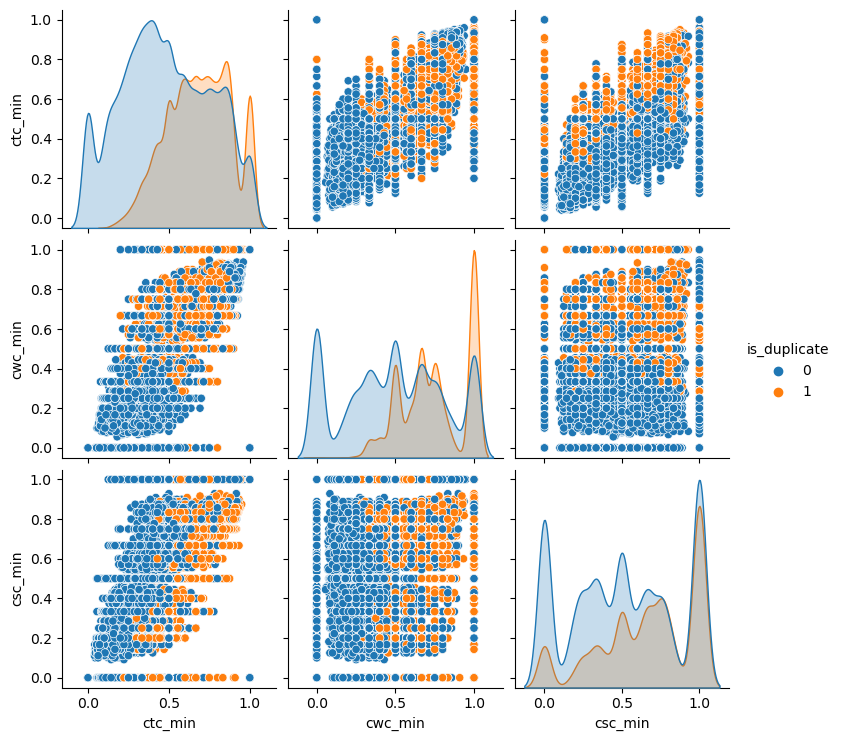

In [30]:
#plotting pairplot
sns.pairplot(new_quora[["ctc_min", "cwc_min", "csc_min", "is_duplicate"]], hue = "is_duplicate")

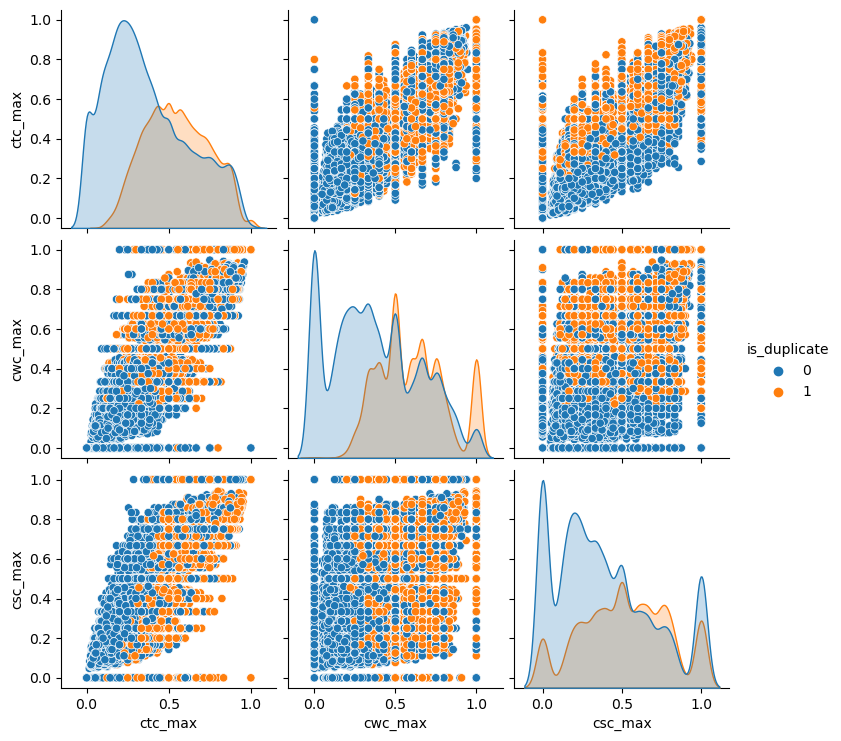

In [31]:
#plotting pairplot
sns.pairplot(new_quora[["ctc_max", "cwc_max", "csc_max", "is_duplicate"]],hue = "is_duplicate")

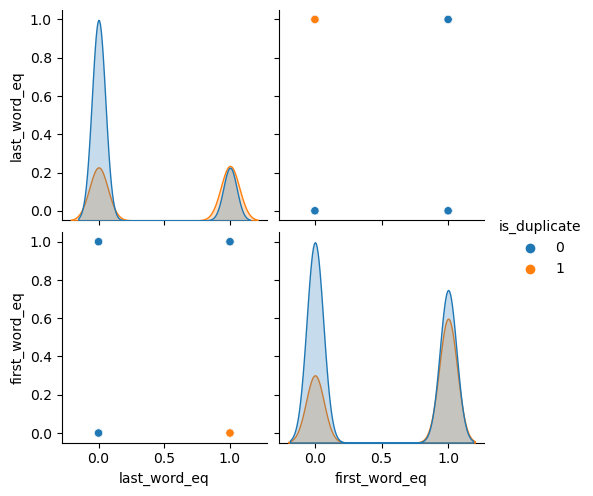

In [32]:
#plotting pairplot
sns.pairplot(new_quora[["last_word_eq", "first_word_eq", "is_duplicate"]], hue = "is_duplicate")

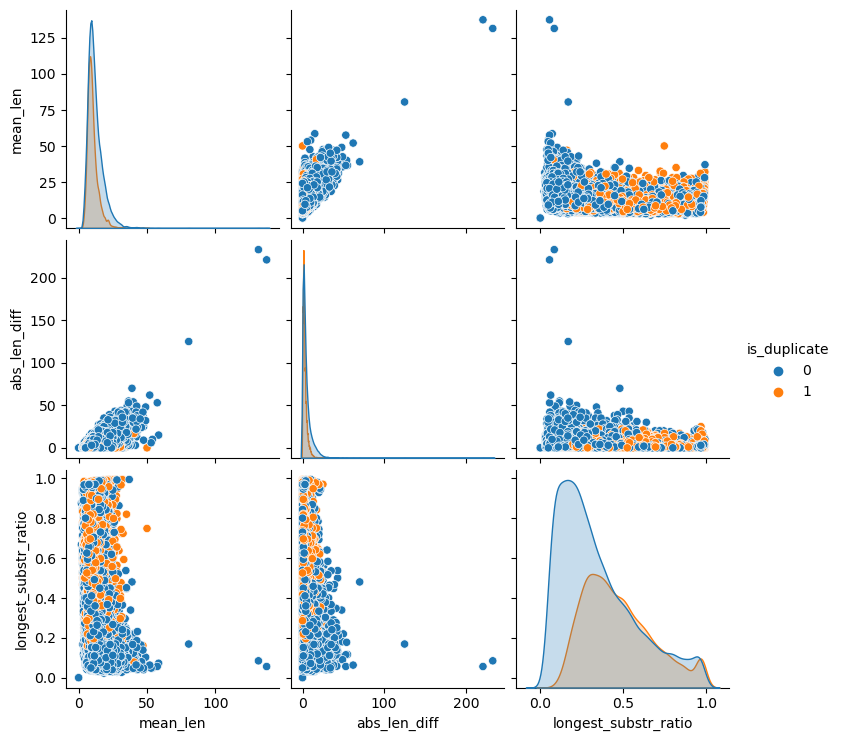

In [33]:
#plotting pairplot
sns.pairplot(new_quora[["mean_len", "abs_len_diff","longest_substr_ratio", "is_duplicate"]], hue = "is_duplicate")

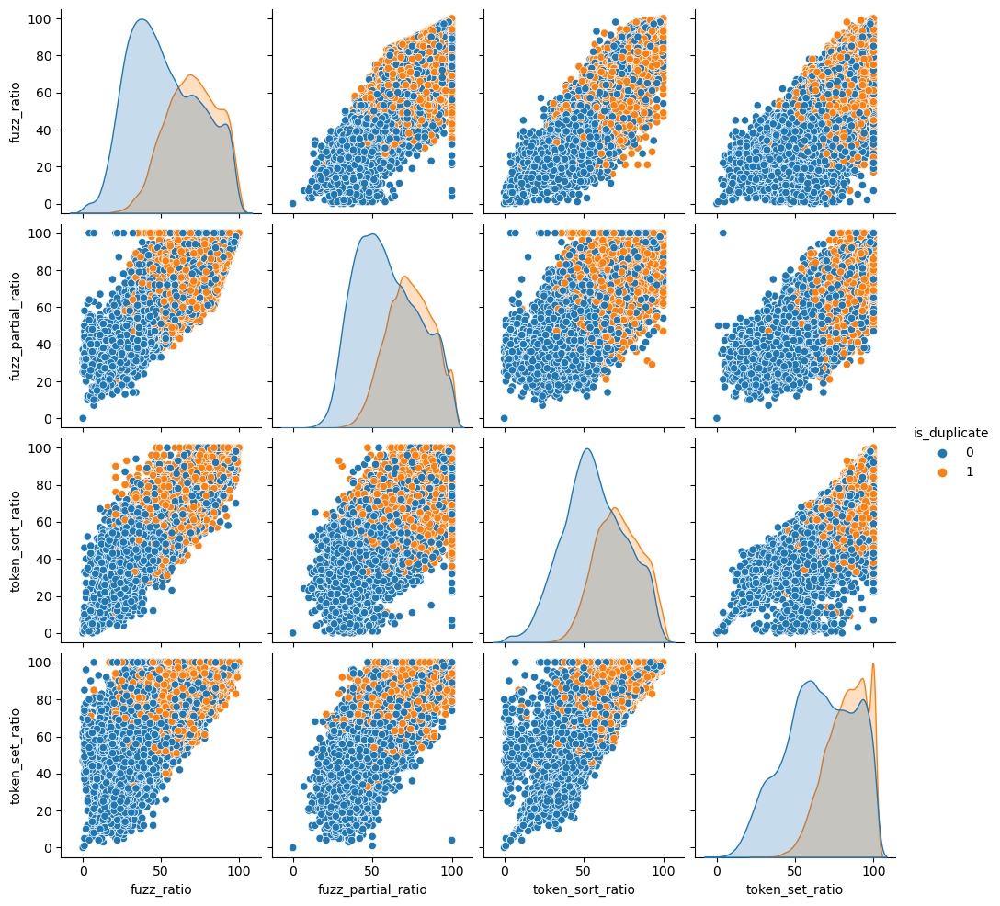

In [34]:
#plotting pairplot
sns.pairplot(new_quora[["fuzz_ratio", "fuzz_partial_ratio","token_sort_ratio","token_set_ratio", "is_duplicate"]], hue = "is_duplicate")

In [35]:
#using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

X = MinMaxScaler().fit_transform(new_quora[["cwc_min", "cwc_max", "csc_min", "csc_max", "ctc_min", "ctc_max", "last_word_eq", "first_word_eq", "abs_len_diff", "mean_len", "token_set_ratio", "token_sort_ratio", "fuzz_ratio", "fuzz_partial_ratio", "longest_substr_ratio"]])
y = new_quora["is_duplicate"].values

In [36]:
from sklearn.manifold import TSNE

#creating a 2D representation of the data using t-SNE
tsne2d = TSNE(
    n_components = 2,          #number of dimensions in the embedded space
    init = "random",           #initialization method for the optimization
    random_state = 101,        #seed for random number generation
    method = "barnes_hut",     #method for optimization ("barnes_hut" for faster optimization)
    n_iter = 1000,             #maximum number of iterations for optimization
    verbose = 2,               #controls the verbosity of the output during optimization
    angle = 0.5                #trade-off parameter for optimization speed vs. accuracy
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.236s...
[t-SNE] Computed neighbors for 50000 samples in 27.561s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sa

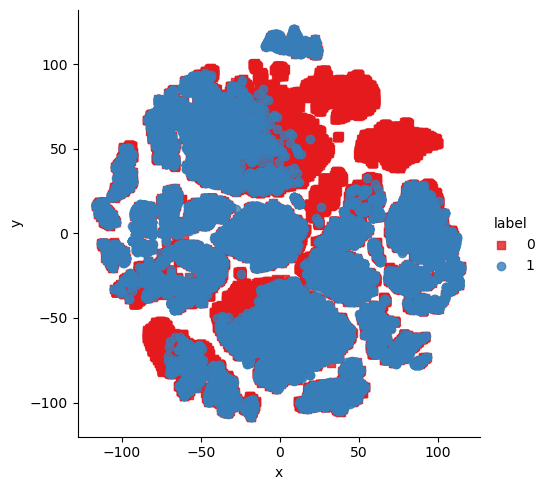

In [37]:
#creating a DataFrame for 2D representation of the data using t-SNE
x_new_quora = pd.DataFrame({"x":tsne2d[:,0], "y":tsne2d[:,1] ,"label":y})

#drawing the plot in appropriate place in the grid
sns.lmplot(data=x_new_quora, x="x", y="y", hue="label", fit_reg=False, palette="Set1", markers=["s","o"])

In [38]:
tsne3d = TSNE(
    n_components = 3,
    init = "random", 
    random_state = 100,
    method = "barnes_hut",
    n_iter = 1000,
    verbose = 2,
    angle = 0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.255s...
[t-SNE] Computed neighbors for 50000 samples in 26.321s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sa

In [39]:
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected = True)

#creating a 3D scatter plot using Plotly with t-SNE data
trace1 = go.Scatter3d(
    x = tsne3d[:,0],
    y = tsne3d[:,1],
    z = tsne3d[:,2],
    mode = "markers",
    marker = dict(
        sizemode = "diameter",
        color = y,                                  #color based on the target variable 'is_duplicate'
        colorscale = "Portland",                    #color scale for better visualization
        colorbar = dict(title = "duplicate"),       #adding colorbar with title
        line = dict(color = "rgb(255, 255, 255)"),  #setting marker line color
        opacity = 0.75                              #setting marker opacity
    )
)

In [40]:
data = [trace1]  #define a list containing the trace1 variable, which represents the 3D scatter plot data.
layout = dict(height = 800, width = 800, title = "3D embedding with engineered features")
fig = dict(data = data, layout = layout)
py.iplot(fig, filename = "3DBubble")

In [41]:
#extracting the 'question1' and 'question2' columns from the DataFrame 'new_quora'
questions = new_quora[["question1","question2"]]
questions.head()

,question1,question2
398782,what is the best marketing automation tool for...,what is the best marketing automation tool for...
115086,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...
327711,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...
367788,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...
151235,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy


In [42]:
#removing unnecessary columns from the DataFrame 'new_quora' and creating a new DataFrame 'quora_final'
quora_final = new_quora.drop(columns=["id","qid1","qid2","question1","question2"])

In [43]:
quora_final.head()

,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,common_words,total_words,word_share,cwc_min,cwc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
398782,1,75,76,13,13,12,26,0.46,0.874989,0.874989,...,0.923070,1.0,1.0,0.0,13.0,0.855263,99,99,99,99
115086,0,48,56,13,16,8,24,0.33,0.666644,0.499988,...,0.466664,1.0,1.0,3.0,13.5,0.224490,69,67,65,74
327711,0,104,119,28,21,4,38,0.11,0.000000,0.000000,...,0.115384,0.0,0.0,6.0,23.0,0.047619,26,29,34,43
367788,0,58,145,14,32,1,34,0.03,0.000000,0.000000,...,0.000000,0.0,0.0,17.0,21.5,0.050847,29,41,23,30
151235,0,34,49,5,9,3,13,0.23,0.749981,0.599988,...,0.333330,1.0,0.0,4.0,7.0,0.542857,55,70,48,69


In [44]:
quora_final.shape

(50000, 23)

In [45]:
#merging texts from 'question1' and 'question2' columns
question = list(questions["question1"]) + list(questions["question2"])

#creating a CountVectorizer with a maximum of 3000 features
cv = CountVectorizer(max_features = 3000)

#using CountVectorizer to transform the merged 'question' list into an array
#split the resulting array into two parts, one for 'question1' and one for 'question2'
q1_arr, q2_arr = np.vsplit(cv.fit_transform(question).toarray(),2)

In [46]:
#creating temporary DataFrames 'temp_quora1' and 'temp_quora2' from arrays 'q1_arr' and 'q2_arr' and indexing them with the same index as the 'questions' DataFrame
temp_quora1 = pd.DataFrame(q1_arr, index = questions.index)
temp_quora2 = pd.DataFrame(q2_arr, index = questions.index)

temp_quora = pd.concat([temp_quora1, temp_quora2], axis = 1)

In [47]:
temp_quora.shape

(50000, 6000)

In [48]:
#concatenating the DataFrames 'quora_final' and 'temp_quora' along the columns axis and assigning it to 'final_quora'
final_quora = pd.concat([quora_final, temp_quora], axis = 1)

In [49]:
final_quora.shape

(50000, 6023)

In [50]:
final_quora.head()

,is_duplicate,q1_len,q2_len,q1_num_words,q2_num_words,common_words,total_words,word_share,cwc_min,cwc_max,...,2990,2991,2992,2993,2994,2995,2996,2997,2998,2999
398782,1,75,76,13,13,12,26,0.46,0.874989,0.874989,...,0,0,0,0,0,0,0,0,0,0
115086,0,48,56,13,16,8,24,0.33,0.666644,0.499988,...,0,0,0,0,0,0,0,0,0,0
327711,0,104,119,28,21,4,38,0.11,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
367788,0,58,145,14,32,1,34,0.03,0.000000,0.000000,...,0,0,1,0,0,0,0,0,0,0
151235,0,34,49,5,9,3,13,0.23,0.749981,0.599988,...,0,0,0,0,0,0,0,0,0,0


In [51]:
#splitting the 'final_quora' DataFrame into training and testing sets
X_train,X_test,y_train,y_test = train_test_split(final_quora.iloc[:,1:].values,final_quora.iloc[:,0].values,test_size=0.2,random_state=2)

### Random Forest

In [52]:
#creating a Random Forest classifier 
forest = RandomForestClassifier()

In [53]:
#fitting the RandomForestClassifier model to the training data
forest.fit(X_train,y_train)

RandomForestClassifier()

In [54]:
#predicting labels using the trained Random Forest model on the test set
y_prediction = forest.predict(X_test)

In [55]:
#accuracy score
accuracy_score(y_test, y_prediction)

0.7987

In [56]:
#classification report
print(classification_report(y_test, y_prediction))

              precision    recall  f1-score   support

           0       0.82      0.87      0.84      6272
           1       0.76      0.68      0.71      3728

    accuracy                           0.80     10000
   macro avg       0.79      0.77      0.78     10000
weighted avg       0.80      0.80      0.80     10000



Text(50.722222222222214, 0.5, 'Actual')

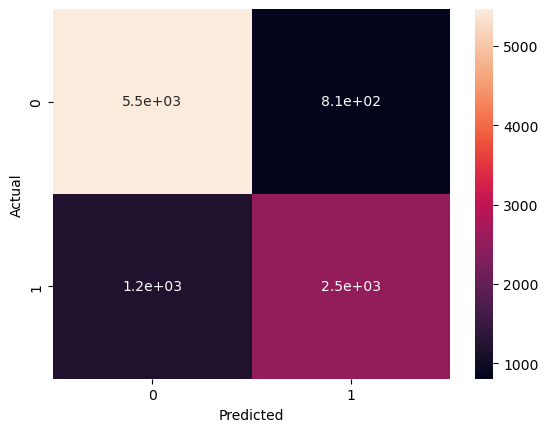

In [57]:
#confusion matrix and heatmap
cmatrix = confusion_matrix(y_test, y_prediction)
sns.heatmap(cmatrix, annot = True)
plt.xlabel("Predicted")
plt.ylabel("Actual")

### SVM

In [58]:
SVM_model = SVC(kernel = "rbf")

In [59]:
SVM_model.fit(X_train,y_train)

SVC()

In [60]:
y_prediction2 = SVM_model.predict(X_test)

In [61]:
accuracy_score(y_test, y_prediction2)

0.7075

In [62]:
print(classification_report(y_test, y_prediction2))

              precision    recall  f1-score   support

           0       0.77      0.76      0.77      6272
           1       0.61      0.62      0.61      3728

    accuracy                           0.71     10000
   macro avg       0.69      0.69      0.69     10000
weighted avg       0.71      0.71      0.71     10000



Text(50.722222222222214, 0.5, 'Actual')

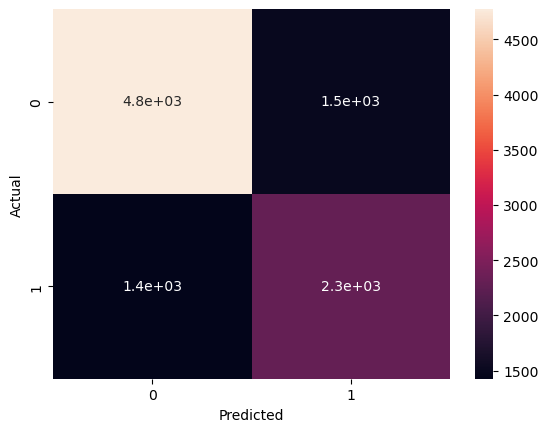

In [63]:
cmatrix = confusion_matrix(y_test, y_prediction2)
sns.heatmap(cmatrix, annot = True)
plt.xlabel("Predicted")
plt.ylabel("Actual")

### Logistic Regression

In [64]:
logistic_model = LogisticRegression()

In [65]:
logistic_model.fit(X_train,y_train)

LogisticRegression()

In [66]:
y_prediction3 = logistic_model.predict(X_test)

In [67]:
accuracy_score(y_test, y_prediction3)

0.7196

In [68]:
print(classification_report(y_test, y_prediction3))

              precision    recall  f1-score   support

           0       0.76      0.81      0.78      6272
           1       0.64      0.56      0.60      3728

    accuracy                           0.72     10000
   macro avg       0.70      0.69      0.69     10000
weighted avg       0.71      0.72      0.72     10000



Text(50.722222222222214, 0.5, 'Actual')

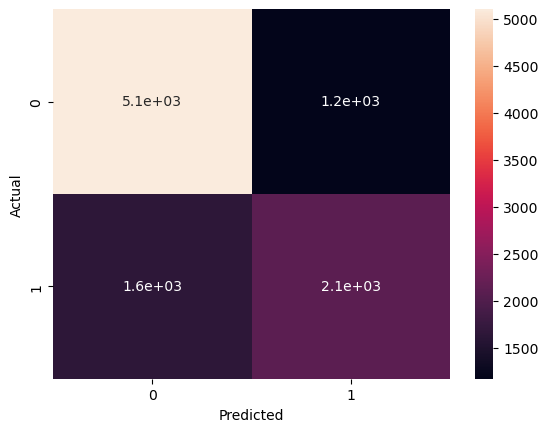

In [69]:
cmatrix = confusion_matrix(y_test, y_prediction3)
sns.heatmap(cmatrix, annot = True)
plt.xlabel("Predicted")
plt.ylabel("Actual")

### GaussianNB

In [70]:
GNB_model = GaussianNB()

In [71]:
GNB_model.fit(X_train, y_train)

GaussianNB()

In [72]:
y_prediction4 = GNB_model.predict(X_test)

In [73]:
print(classification_report(y_test, y_prediction4))

              precision    recall  f1-score   support

           0       0.79      0.53      0.63      6272
           1       0.49      0.77      0.60      3728

    accuracy                           0.62     10000
   macro avg       0.64      0.65      0.62     10000
weighted avg       0.68      0.62      0.62     10000



Text(50.722222222222214, 0.5, 'Actual')

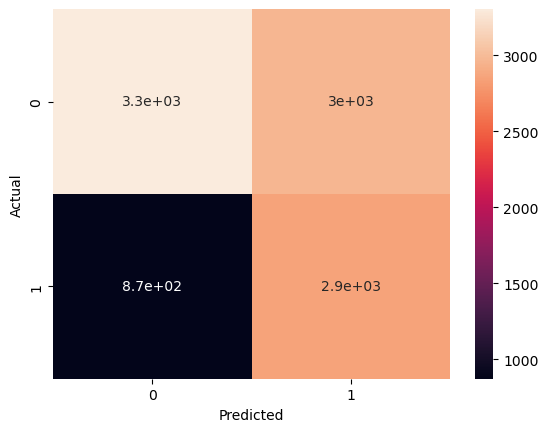

In [74]:
cmatrix = confusion_matrix(y_test, y_prediction4)
sns.heatmap(cmatrix, annot = True)
plt.xlabel("Predicted")
plt.ylabel("Actual")

### XGBoost

In [75]:
xgb = XGBClassifier()

In [76]:
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [77]:
y_prediction5 = xgb.predict(X_test)

In [78]:
print(classification_report(y_test, y_prediction5))

              precision    recall  f1-score   support

           0       0.83      0.85      0.84      6272
           1       0.74      0.71      0.72      3728

    accuracy                           0.80     10000
   macro avg       0.78      0.78      0.78     10000
weighted avg       0.80      0.80      0.80     10000



Text(50.722222222222214, 0.5, 'Actual')

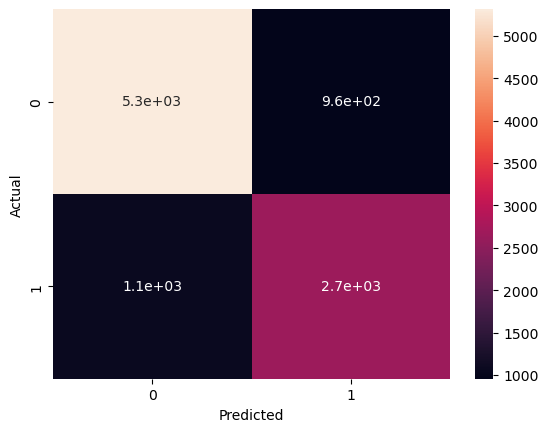

In [79]:
cmatrix = confusion_matrix(y_test, y_prediction5)
sns.heatmap(cmatrix, annot = True)
plt.xlabel("Predicted")
plt.ylabel("Actual")

In [80]:
def test_common_words(q1, q2):
    #split sentence q1 into words, convert to lowercase, and create a set of unique words
    w1 = set(map(lambda word: word.lower().strip(), q1.split(" ")))
    #split sentence q2 into words, convert to lowercase, and create a set of unique words
    w2 = set(map(lambda word: word.lower().strip(), q2.split(" ")))    
    #return the count of common words between the two sets of words
    return len(w1 & w2)

In [81]:
def test_total_words(q1, q2):
    #split sentence q1 into words, convert to lowercase, and create a set of unique words
    w1 = set(map(lambda word: word.lower().strip(), q1.split(" ")))
    #split sentence q2 into words, convert to lowercase, and create a set of unique words
    w2 = set(map(lambda word: word.lower().strip(), q2.split(" ")))    
    #return the total count of words in both sentences combined
    return (len(w1) + len(w2))

In [82]:
def test_fetch_token_features(q1,q2):
    
    #define a small constant to avoid division by zero
    SAFE_DIV = 0.0001 
    
    #import stopwords from the NLTK library for English language
    STOP_WORDS = stopwords.words("english")
    
    #initialize a list of token features with zeros
    token_features = [0.0]*8
    
    #converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()
    
    #if either question has no tokens, return the list of token features with zeros
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    #get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    #get the count of common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    #get the count of common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    #get the count of common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    #calculate various token features
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    #check if the last word of both questions is the same
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    #check if the first word of both questions is the same
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    #return the list of calculated token features
    return token_features

In [83]:
def test_fetch_length_features(q1,q2):
    
    length_features = [0.0]*3  #initialize a list to store length features, initially filled with zeros
    
    #converting the Sentence into Tokens: 
    q1_tokens = q1.split()  #split the first sentence into tokens
    q2_tokens = q2.split()  #split the second sentence into tokens
    
    if len(q1_tokens) == 0 or len(q2_tokens) == 0:  #if either sentence has no tokens, return the list of length features with zeros
        return length_features
    
    #absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))  #calculate the absolute difference in token lengths
    
    #average Token Length of both Questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens))/2  #calculate the average token length of both sentences
    
    strs = list(distance.lcsubstrings(q1, q2))  #calculate the longest common substring between the two sentences
    length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)  #calculate the ratio of the length of the longest common substring to the minimum length of the two sentences
    
    return length_features  #return the list of calculated length features

In [84]:
def test_fetch_fuzzy_features(q1,q2):
    
    fuzzy_features = [0.0]*4  #initialize a list to store fuzzy features, initially filled with zeros
    
    #calculate different fuzzy matching ratios between the two input sentences
    
    #fuzz_ratio: Compares entire strings, returns a ratio between 0 and 100 indicating similarity
    fuzzy_features[0] = fuzz.QRatio(q1, q2)
    
    #fuzz_partial_ratio: Compares partial strings, returns a ratio between 0 and 100 indicating similarity
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)
    
    #token_sort_ratio: Compares sorted token lists, returns a ratio between 0 and 100 indicating similarity
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)
    
    #token_set_ratio: Compares token sets, returns a ratio between 0 and 100 indicating similarity
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)
    
    return fuzzy_features  #return the list of calculated fuzzy features

In [85]:
def query_point_creator(q1,q2):
    
    input_query = []  #initialize an empty list to store features
    
    #preprocess the input sentences
    q1 = preprocessing(q1)
    q2 = preprocessing(q2)
    
    #fetch basic features
    
    #append lengths of q1 and q2
    input_query.append(len(q1))
    input_query.append(len(q2))
    
    #append number of words in q1 and q2
    input_query.append(len(q1.split(" ")))
    input_query.append(len(q2.split(" ")))
    
    #fetch and append common word features
    input_query.append(test_common_words(q1,q2))
    input_query.append(test_total_words(q1,q2))
    input_query.append(round(test_common_words(q1,q2)/test_total_words(q1,q2),2))
    
    #fetch token features and append
    token_features = test_fetch_token_features(q1,q2)
    input_query.extend(token_features)
    
    #fetch length based features and append
    length_features = test_fetch_length_features(q1,q2)
    input_query.extend(length_features)
    
    #fetch fuzzy features and append
    fuzzy_features = test_fetch_fuzzy_features(q1,q2)
    input_query.extend(fuzzy_features)
    
    #create bag-of-words (BOW) features for q1 and q2
    q1_bow = cv.transform([q1]).toarray()  #convert q1 into bag-of-words representation
    q2_bow = cv.transform([q2]).toarray()  #convert q2 into bag-of-words representation
    
    #concatenate all features along columns to create the final input query point
    return np.hstack((np.array(input_query).reshape(1,22),q1_bow,q2_bow))  #stack the arrays horizontally

In [113]:
#define some example queries
q1 = "What is the captial of West Bengal?"

q2 = "What is the captial of India?"

q3 = "What is the current capital of India?"

q4 = "Which country wins the Fifa Football World Cup?"

q5 = "Which country lifted the football worldcup in Qatar?"

q6 = "Which city is the capital of West Bengal?"

In [114]:
query_point_creator(q2,q3)

array([[28., 36.,  6., ...,  0.,  0.,  0.]])

In [115]:
query_point_creator(q2,q3).shape

(1, 6022)

In [116]:
forest.predict(query_point_creator(q2,q5))   #1-same questions, 0-different questions

array([0], dtype=int64)

In [117]:
cv

CountVectorizer(max_features=3000)

In [118]:
import pickle

pickle.dump(forest,open("forestmodel.pkl","wb"))
pickle.dump(cv,open("cv.pkl","wb"))